In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, f1_score
import xgboost as xgb
from sklearn.feature_selection import RFECV

In [4]:
merged_df = pd.read_csv('./modeling_data/master_df_add_moving_encoding.csv')

In [5]:
merged_df.columns

Index(['game_id', 'club_id_x', 'club_id_y', 'B365HW', 'B365D', 'B365AW',
       'Table_x', 'Table_y', 'manager_name_x', 'manager_name_y',
       'home_team_id', 'Result', 'Referee', 'total_games_x', 'wins_x',
       'win_percentage_x', 'total_games_vs_opponent_x', 'wins_vs_opponent_x',
       'win_percentage_vs_opponent_x', 'TY_x', 'OY_x', 'TR_x', 'OR_x',
       'Possesion_x', 'Aerial Duels(%)_x', 'GF_x', 'GA_x', 'Shot on Target_x',
       'Shot on Target(%)_x', 'Goals per Shot_x', 'Expected Goals_x',
       'Save%_x', 'Clean Sheet_x', 'Pass Completion %_x', 'Assists_x',
       'Exp. Assisted Goals_x', 'Expected Assists_x', 'Tackles Won_x',
       '% of Dribblers Tackled_x', 'Blocks_x', 'Interceptions_x', 'Error_x',
       'market_value_in_eur_x', 'total_games_y', 'wins_y', 'win_percentage_y',
       'total_games_vs_opponent_y', 'wins_vs_opponent_y',
       'win_percentage_vs_opponent_y', 'TY_y', 'OY_y', 'TR_y', 'OR_y',
       'Possesion_y', 'Aerial Duels(%)_y', 'GF_y', 'GA_y', 'Shot o

In [7]:
independent_variable = ['club_id_x', 'club_id_y', 'B365HW', 'B365D', 'B365AW',
       'Table_x', 'Table_y', 'manager_name_x', 'manager_name_y',
       'home_team_id', 'Referee', 'total_games_x', 'wins_x',
       'win_percentage_x', 'total_games_vs_opponent_x', 'wins_vs_opponent_x',
       'win_percentage_vs_opponent_x', 'TY_x', 'OY_x', 'TR_x', 'OR_x',
       'Possesion_x', 'Aerial Duels(%)_x', 'GF_x', 'GA_x', 'Shot on Target_x',
       'Shot on Target(%)_x', 'Goals per Shot_x', 'Expected Goals_x',
       'Save%_x', 'Clean Sheet_x', 'Pass Completion %_x', 'Assists_x',
       'Exp. Assisted Goals_x', 'Expected Assists_x', 'Tackles Won_x',
       '% of Dribblers Tackled_x', 'Blocks_x', 'Interceptions_x', 'Error_x',
       'market_value_in_eur_x', 'total_games_y', 'wins_y', 'win_percentage_y',
       'total_games_vs_opponent_y', 'wins_vs_opponent_y',
       'win_percentage_vs_opponent_y', 'TY_y', 'OY_y', 'TR_y', 'OR_y',
       'Possesion_y', 'Aerial Duels(%)_y', 'GF_y', 'GA_y', 'Shot on Target_y',
       'Shot on Target(%)_y', 'Goals per Shot_y', 'Expected Goals_y',
       'Save%_y', 'Clean Sheet_y', 'Pass Completion %_y', 'Assists_y',
       'Exp. Assisted Goals_y', 'Expected Assists_y', 'Tackles Won_y',
       '% of Dribblers Tackled_y', 'Blocks_y', 'Interceptions_y', 'Error_y',
       'market_value_in_eur_y']

In [9]:
# 전처리 없이 쌩으로 모델링

In [10]:
# 데이터셋 train과 test로 나누기
X = merged_df[independent_variable]
y = merged_df['Result']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [11]:
# 1. RandomForestClassifier

In [12]:
rf_model = RandomForestClassifier(n_estimators=300, random_state=42)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.6069767441860465
F1 Score: 0.5517880880349183


## 라벨인코딩만 하고 다른 전처리는 안한 상태(쌩)로 했을 때 가장 잘 나온 하이퍼 파라미터 조합
### 1. RandomForestClassifier 
   #### - 스펙 : n_estimators=300, random_state=42
   #### - 성능 : Accuracy: 0.6069767441860465,  F1 Score: 0.5517880880349183

In [13]:
# 2. XGBClassifier

In [14]:
xgb_model = xgb.XGBClassifier(n_estimators=300, max_depth=7, min_child_weight=2, random_state=42)
xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.6
F1 Score: 0.5834841690388038


## 라벨인코딩만 하고 다른 전처리는 안한 상태(쌩)로 했을 때 가장 잘 나온 하이퍼 파라미터 조합
### 2. XGBClassifier 
   #### - 스펙 : n_estimators=300, max_depth=7, min_child_weight=2, random_state=42
   #### - 성능 :  Accuracy: Accuracy: 0.6,  F1 Score: 0.5834841690388038

In [15]:
# 3. GradientBoostingClassifier

In [16]:
gb_model = GradientBoostingClassifier(n_estimators=100, max_depth=2, random_state=42)
gb_model.fit(X_train, y_train)

# 테스트 데이터로 예측
y_pred = gb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.6069767441860465
F1 Score: 0.5624002633396993


## 라벨인코딩만 하고 다른 전처리는 안한 상태(쌩)로 했을 때 가장 잘 나온 하이퍼 파라미터 조합
### 3. GradientBoostingClassifier 
   #### - 스펙 : n_estimators=100, max_depth=2, random_state=42
   #### - 성능 : Accuracy: 0.6069767441860465, F1 Score: 0.5624002633396993

In [53]:
# 전처리 하고 모델링 하기

In [54]:
def get_3_hist(data:pd.DataFrame, columns:list):
    
    plt.figure(figsize=(15, 5 * (len(columns) // 3)))

    for i, col in enumerate(columns):
        plt.subplot(len(columns) // 3 + (len(columns) % 3 > 0), 3, i + 1)
        sns.histplot(data[col], kde=True)
        plt.title(col)

    # 전체 그림 표시
    plt.tight_layout()
    plt.show()

In [55]:
# 이상치 제거하기

In [56]:
# 이상치 제거할 컬럼

selected_col_for_remove = [
       'Possesion_x', 'Aerial Duels(%)_x', 'GF_x', 'GA_x', 'Shot on Target_x',
       'Shot on Target(%)_x', 'Goals per Shot_x', 'Expected Goals_x',
       'Save%_x', 'Clean Sheet_x', 'Pass Completion %_x', 'Assists_x',
       'Exp. Assisted Goals_x', 'Expected Assists_x', 'Tackles Won_x',
       '% of Dribblers Tackled_x', 'Blocks_x', 'Interceptions_x', 'Error_x',
       'market_value_in_eur_x', 'Possesion_y',
       'Aerial Duels(%)_y', 'GF_y', 'GA_y', 'Shot on Target_y',
       'Shot on Target(%)_y', 'Goals per Shot_y', 'Expected Goals_y',
       'Save%_y', 'Clean Sheet_y', 'Pass Completion %_y', 'Assists_y',
       'Exp. Assisted Goals_y', 'Expected Assists_y', 'Tackles Won_y',
       '% of Dribblers Tackled_y', 'Blocks_y', 'Interceptions_y', 'Error_y',
       'market_value_in_eur_y']

In [57]:
# z-score를 계산하여 이상치가 있는지 확인하고 이상치를 제외한 데이터 반환
def remove_outliers(df, threshold):
    z_scores = (df - df.mean()) / df.std()
    no_outliers_df = df[(z_scores <= threshold) & (z_scores >= -threshold)]
    return no_outliers_df

# 각 컬럼의 이상치 제거 전/후 히스토그램을 나란히 그리는 함수
def plot_histogram_with_outliers(df, threshold):
    num_columns = len(df.columns)
    fig, axs = plt.subplots(num_columns, 2, figsize=(10, 3*num_columns))  # 크기 조정
    
    # 이상치 제거한 횟수를 저장할 리스트
    outlier_removal_counts = []
    
    for i, col in enumerate(df.columns):
        # 이상치 제거 전 히스토그램
        axs[i, 0].hist(df[col], bins=20, color='blue', alpha=0.7)
        axs[i, 0].set_title(f'Histogram of {col} (Before Removing Outliers)')
        axs[i, 0].set_xlabel('Values')
        axs[i, 0].set_ylabel('Frequency')
        
        # 이상치 제거 후 히스토그램
        no_outliers_df = remove_outliers(df[col], threshold)
        axs[i, 1].hist(no_outliers_df, bins=20, color='green', alpha=0.7)
        axs[i, 1].set_title(f'Histogram of {col} (After Removing Outliers)')
        axs[i, 1].set_xlabel('Values')
        axs[i, 1].set_ylabel('Frequency')
        
        # 이상치 제거한 횟수 저장
        outlier_removal_counts.append(len(df) - len(no_outliers_df))

    # 이상치 제거한 횟수를 출력
    for i, col in enumerate(df.columns):
        print(f'Number of outliers removed in {col}: {outlier_removal_counts[i]}')

    plt.tight_layout()
    plt.show()

In [58]:
# 데이터프레임에서 이상치 제거 전/후 히스토그램 그리기 : threshold 3
plot_histogram_with_outliers(merged_df[selected_col_for_remove], 3)

Number of outliers removed in Possesion_x: 0
Number of outliers removed in Aerial Duels(%)_x: 6
Number of outliers removed in GF_x: 15
Number of outliers removed in GA_x: 14
Number of outliers removed in Shot on Target_x: 11
Number of outliers removed in Shot on Target(%)_x: 14
Number of outliers removed in Goals per Shot_x: 20
Number of outliers removed in Expected Goals_x: 17
Number of outliers removed in Save%_x: 16
Number of outliers removed in Clean Sheet_x: 0
Number of outliers removed in Pass Completion %_x: 3
Number of outliers removed in Assists_x: 33
Number of outliers removed in Exp. Assisted Goals_x: 23
Number of outliers removed in Expected Assists_x: 21
Number of outliers removed in Tackles Won_x: 8
Number of outliers removed in % of Dribblers Tackled_x: 8
Number of outliers removed in Blocks_x: 8
Number of outliers removed in Interceptions_x: 12
Number of outliers removed in Error_x: 30
Number of outliers removed in market_value_in_eur_x: 12
Number of outliers removed in

In [59]:
# 데이터프레임에서 이상치 제거 전/후 히스토그램 그리기 : threshold 4
plot_histogram_with_outliers(merged_df[selected_col_for_remove], 4)

Number of outliers removed in Possesion_x: 0
Number of outliers removed in Aerial Duels(%)_x: 1
Number of outliers removed in GF_x: 2
Number of outliers removed in GA_x: 3
Number of outliers removed in Shot on Target_x: 1
Number of outliers removed in Shot on Target(%)_x: 2
Number of outliers removed in Goals per Shot_x: 6
Number of outliers removed in Expected Goals_x: 2
Number of outliers removed in Save%_x: 0
Number of outliers removed in Clean Sheet_x: 0
Number of outliers removed in Pass Completion %_x: 0
Number of outliers removed in Assists_x: 3
Number of outliers removed in Exp. Assisted Goals_x: 1
Number of outliers removed in Expected Assists_x: 3
Number of outliers removed in Tackles Won_x: 0
Number of outliers removed in % of Dribblers Tackled_x: 1
Number of outliers removed in Blocks_x: 1
Number of outliers removed in Interceptions_x: 2
Number of outliers removed in Error_x: 1
Number of outliers removed in market_value_in_eur_x: 0
Number of outliers removed in Possesion_y:

In [60]:
# # 데이터프레임에서 이상치 제거 전/후 히스토그램 그리기 : threshold 5
# plot_histogram_with_outliers(merged_df[selected_col_for_remove], 5)

In [61]:
remove_outliers(merged_df[selected_col_for_remove], 5)

,Possesion_x,Aerial Duels(%)_x,GF_x,GA_x,Shot on Target_x,Shot on Target(%)_x,Goals per Shot_x,Expected Goals_x,Save%_x,Clean Sheet_x,...,Pass Completion %_y,Assists_y,Exp. Assisted Goals_y,Expected Assists_y,Tackles Won_y,% of Dribblers Tackled_y,Blocks_y,Interceptions_y,Error_y,market_value_in_eur_y
0,57.000000,47.400000,2.666667,2.000000,9.000000,54.500000,0.143333,1.966667,62.000000,0.000000,...,80.166667,1.000000,1.466667,1.133333,10.333333,31.400000,13.000000,10.000000,1.333333,3.107143e+07
1,65.333333,49.266667,2.666667,1.333333,7.666667,46.733333,0.156667,1.500000,54.433333,0.000000,...,82.600000,1.666667,0.866667,1.066667,9.000000,43.866667,8.666667,9.000000,0.666667,3.188095e+07
2,62.666667,53.266667,2.000000,0.333333,3.000000,31.500000,0.166667,1.066667,83.333333,0.666667,...,80.066667,2.666667,0.800000,0.900000,10.333333,42.466667,13.333333,10.000000,0.666667,3.078571e+07
3,59.000000,48.800000,3.333333,1.333333,5.000000,46.000000,0.336667,1.566667,75.000000,0.000000,...,81.200000,3.000000,1.366667,1.533333,10.000000,45.666667,13.000000,10.333333,0.666667,3.167857e+07
4,62.000000,53.600000,2.000000,1.333333,4.000000,31.166667,0.176667,1.666667,75.000000,0.000000,...,83.433333,0.666667,0.766667,0.900000,11.000000,36.466667,10.666667,11.333333,1.333333,3.398810e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2140,53.666667,54.033333,1.666667,1.666667,4.666667,34.600000,0.070000,1.700000,58.333333,0.000000,...,87.566667,1.000000,1.366667,1.300000,9.666667,48.000000,12.666667,9.333333,0.666667,1.682609e+07
2141,66.333333,60.400000,0.000000,1.333333,4.333333,28.633333,0.000000,1.400000,83.333333,0.666667,...,86.966667,0.666667,1.400000,1.500000,9.333333,41.200000,10.000000,9.333333,0.333333,1.681498e+07
2142,58.333333,45.200000,1.666667,2.333333,3.333333,36.133333,0.103333,1.166667,65.566667,0.000000,...,85.900000,1.333333,0.966667,1.066667,12.666667,46.633333,10.333333,7.666667,1.333333,1.787153e+07
2143,65.000000,52.133333,3.333333,1.000000,5.666667,41.233333,0.160000,1.833333,82.233333,0.333333,...,86.200000,1.000000,1.133333,1.233333,9.333333,35.800000,12.000000,7.000000,0.000000,2.034306e+07


In [62]:
merged_df[selected_col_for_remove] = merged_df[selected_col_for_remove].apply(lambda x: remove_outliers(x, 4))

In [63]:
merged_df = merged_df.dropna()

In [64]:
merged_df

,game_id,club_id_x,club_id_y,B365HW,B365D,B365AW,Table_x,Table_y,manager_name_x,manager_name_y,...,Pass Completion %_y,Assists_y,Exp. Assisted Goals_y,Expected Assists_y,Tackles Won_y,% of Dribblers Tackled_y,Blocks_y,Interceptions_y,Error_y,market_value_in_eur_y
0,3050168,989,603,52.631579,27.777778,22.222222,3,15,21,51,...,80.166667,1.000000,1.466667,1.133333,10.333333,31.400000,13.000000,10.000000,1.333333,3.107143e+07
1,3050169,931,873,40.000000,29.411765,33.333333,15,3,75,68,...,82.600000,1.666667,0.866667,1.066667,9.000000,43.866667,8.666667,9.000000,0.666667,3.188095e+07
2,3050170,1110,631,15.384615,25.000000,62.111801,19,2,18,44,...,80.066667,2.666667,0.800000,0.900000,10.333333,42.466667,13.333333,10.000000,0.666667,3.078571e+07
3,3050171,31,379,80.000000,15.384615,7.142857,1,20,36,38,...,81.200000,3.000000,1.366667,1.533333,10.000000,45.666667,13.000000,10.333333,0.666667,3.167857e+07
4,3050172,985,1003,63.694268,25.641026,13.333333,7,13,34,13,...,83.433333,0.666667,0.766667,0.900000,11.000000,36.466667,10.666667,11.333333,1.333333,3.398810e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2140,4095359,543,931,40.000000,29.411765,36.363636,9,12,25,40,...,87.566667,1.000000,1.366667,1.300000,9.666667,48.000000,12.666667,9.333333,0.666667,1.682609e+07
2141,4095362,1132,1148,30.769231,27.777778,46.511628,19,15,83,80,...,86.966667,0.666667,1.400000,1.500000,9.333333,41.200000,10.000000,9.333333,0.333333,1.681498e+07
2142,4095365,931,148,28.571429,26.315789,51.282051,12,5,40,4,...,85.900000,1.333333,0.966667,1.066667,12.666667,46.633333,10.333333,7.666667,1.333333,1.787153e+07
2143,4095366,1031,703,35.714286,28.571429,40.816327,18,17,66,53,...,86.200000,1.000000,1.133333,1.233333,9.333333,35.800000,12.000000,7.000000,0.000000,2.034306e+07


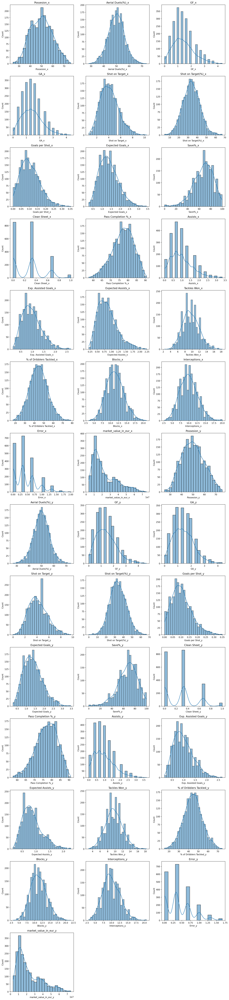

In [65]:
get_3_hist(merged_df, selected_col_for_remove)

In [65]:
# 표준화

In [61]:
# log 스케일링 할 컬럼

In [62]:
skewed_col = ['market_value_in_eur_x', 'market_value_in_eur_y']

In [63]:
merged_df[skewed_col] = np.log1p(merged_df[skewed_col])

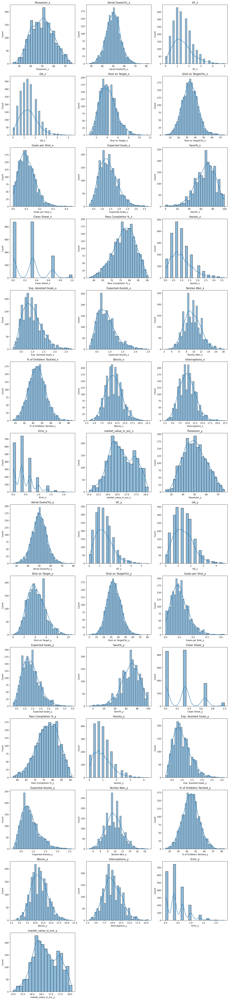

In [64]:
get_3_hist(merged_df, selected_col_for_remove)

In [66]:
# minmax scaling하기 
# scaling할 컬럼
col_to_minmax = ['TY_x', 'OY_x', 'TR_x', 'OR_x',
'Possesion_x', 'Aerial Duels(%)_x', 'GF_x', 'GA_x', 'Shot on Target_x',
'Shot on Target(%)_x', 'Goals per Shot_x', 'Expected Goals_x',
'Save%_x', 'Clean Sheet_x', 'Pass Completion %_x', 'Assists_x',
'Exp. Assisted Goals_x', 'Expected Assists_x', 'Tackles Won_x',
'% of Dribblers Tackled_x', 'Blocks_x', 'Interceptions_x', 'Error_x',
'market_value_in_eur_x', 'TY_y', 'OY_y', 'TR_y', 'OR_y', 'Possesion_y',
'Aerial Duels(%)_y', 'GF_y', 'GA_y', 'Shot on Target_y',
'Shot on Target(%)_y', 'Goals per Shot_y', 'Expected Goals_y',
'Save%_y', 'Clean Sheet_y', 'Pass Completion %_y', 'Assists_y',
'Exp. Assisted Goals_y', 'Expected Assists_y', 'Tackles Won_y',
'% of Dribblers Tackled_y', 'Blocks_y', 'Interceptions_y', 'Error_y',
'market_value_in_eur_y']

In [69]:
# MinMaxScaler 객체 생성
scaler = MinMaxScaler()

In [71]:
# 선택한 컬럼에 대해 스케일링 적용
merged_df[col_to_minmax] = scaler.fit_transform(merged_df[col_to_minmax])

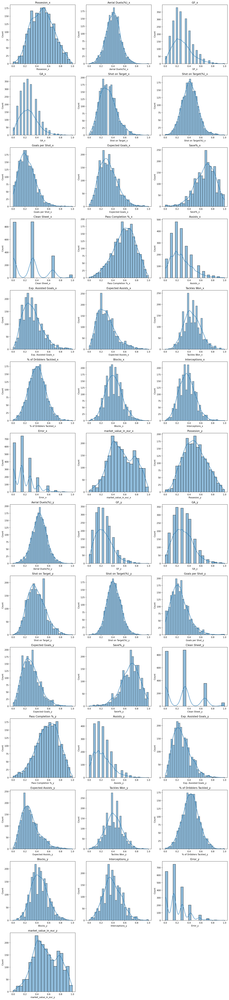

In [72]:
get_3_hist(merged_df, selected_col_for_remove)

In [75]:
merged_df.columns

Index(['game_id', 'club_id_x', 'club_id_y', 'B365HW', 'B365D', 'B365AW',
       'Table_x', 'Table_y', 'manager_name_x', 'manager_name_y',
       'home_team_id', 'Result', 'Referee', 'TY_x', 'OY_x', 'TR_x', 'OR_x',
       'Possesion_x', 'Aerial Duels(%)_x', 'GF_x', 'GA_x', 'Shot on Target_x',
       'Shot on Target(%)_x', 'Goals per Shot_x', 'Expected Goals_x',
       'Save%_x', 'Clean Sheet_x', 'Pass Completion %_x', 'Assists_x',
       'Exp. Assisted Goals_x', 'Expected Assists_x', 'Tackles Won_x',
       '% of Dribblers Tackled_x', 'Blocks_x', 'Interceptions_x', 'Error_x',
       'market_value_in_eur_x', 'TY_y', 'OY_y', 'TR_y', 'OR_y', 'Possesion_y',
       'Aerial Duels(%)_y', 'GF_y', 'GA_y', 'Shot on Target_y',
       'Shot on Target(%)_y', 'Goals per Shot_y', 'Expected Goals_y',
       'Save%_y', 'Clean Sheet_y', 'Pass Completion %_y', 'Assists_y',
       'Exp. Assisted Goals_y', 'Expected Assists_y', 'Tackles Won_y',
       '% of Dribblers Tackled_y', 'Blocks_y', 'Interceptions_y

In [77]:
corr = merged_df[['club_id_x', 'club_id_y', 'B365HW', 'B365D', 'B365AW',
       'Table_x', 'Table_y', 'manager_name_x', 'manager_name_y',
       'home_team_id', 'Result', 'Referee', 'TY_x', 'OY_x', 'TR_x', 'OR_x',
       'Possesion_x', 'Aerial Duels(%)_x', 'GF_x', 'GA_x', 'Shot on Target_x',
       'Shot on Target(%)_x', 'Goals per Shot_x', 'Expected Goals_x',
       'Save%_x', 'Clean Sheet_x', 'Pass Completion %_x', 'Assists_x',
       'Exp. Assisted Goals_x', 'Expected Assists_x', 'Tackles Won_x',
       '% of Dribblers Tackled_x', 'Blocks_x', 'Interceptions_x', 'Error_x',
       'market_value_in_eur_x', 'TY_y', 'OY_y', 'TR_y', 'OR_y', 'Possesion_y',
       'Aerial Duels(%)_y', 'GF_y', 'GA_y', 'Shot on Target_y',
       'Shot on Target(%)_y', 'Goals per Shot_y', 'Expected Goals_y',
       'Save%_y', 'Clean Sheet_y', 'Pass Completion %_y', 'Assists_y',
       'Exp. Assisted Goals_y', 'Expected Assists_y', 'Tackles Won_y',
       '% of Dribblers Tackled_y', 'Blocks_y', 'Interceptions_y', 'Error_y',
       'market_value_in_eur_y']].corr()

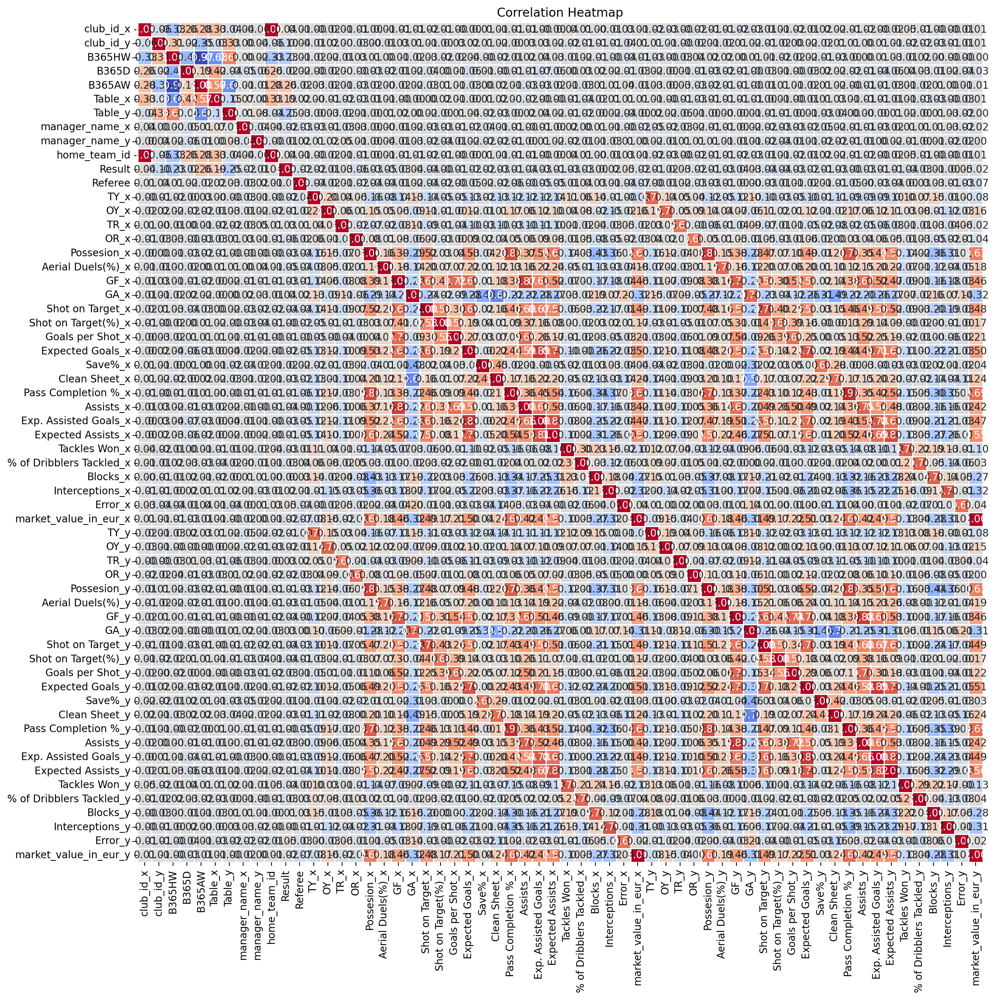

In [78]:
# 상관관계 그래프 그리기
plt.figure(figsize=(15, 15))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, cbar=False)
plt.title('Correlation Heatmap')
plt.show()

In [81]:
merged_df.columns

Index(['game_id', 'club_id_x', 'club_id_y', 'B365HW', 'B365D', 'B365AW',
       'Table_x', 'Table_y', 'manager_name_x', 'manager_name_y',
       'home_team_id', 'Result', 'Referee', 'TY_x', 'OY_x', 'TR_x', 'OR_x',
       'Possesion_x', 'Aerial Duels(%)_x', 'GF_x', 'GA_x', 'Shot on Target_x',
       'Shot on Target(%)_x', 'Goals per Shot_x', 'Expected Goals_x',
       'Save%_x', 'Clean Sheet_x', 'Pass Completion %_x', 'Assists_x',
       'Exp. Assisted Goals_x', 'Expected Assists_x', 'Tackles Won_x',
       '% of Dribblers Tackled_x', 'Blocks_x', 'Interceptions_x', 'Error_x',
       'market_value_in_eur_x', 'TY_y', 'OY_y', 'TR_y', 'OR_y', 'Possesion_y',
       'Aerial Duels(%)_y', 'GF_y', 'GA_y', 'Shot on Target_y',
       'Shot on Target(%)_y', 'Goals per Shot_y', 'Expected Goals_y',
       'Save%_y', 'Clean Sheet_y', 'Pass Completion %_y', 'Assists_y',
       'Exp. Assisted Goals_y', 'Expected Assists_y', 'Tackles Won_y',
       '% of Dribblers Tackled_y', 'Blocks_y', 'Interceptions_y

In [82]:
independent_variable = ['club_id_x', 'club_id_y', 'B365HW', 'B365D', 'B365AW',
       'Table_x', 'Table_y', 'manager_name_x', 'manager_name_y',
       'home_team_id', 'Referee', 'TY_x', 'OY_x', 'TR_x', 'OR_x',
       'Possesion_x', 'Aerial Duels(%)_x', 'GF_x', 'GA_x', 'Shot on Target_x',
       'Shot on Target(%)_x', 'Goals per Shot_x', 'Expected Goals_x',
       'Save%_x', 'Clean Sheet_x', 'Pass Completion %_x', 'Assists_x',
       'Exp. Assisted Goals_x', 'Expected Assists_x', 'Tackles Won_x',
       '% of Dribblers Tackled_x', 'Blocks_x', 'Interceptions_x', 'Error_x',
       'market_value_in_eur_x', 'TY_y', 'OY_y', 'TR_y', 'OR_y', 'Possesion_y',
       'Aerial Duels(%)_y', 'GF_y', 'GA_y', 'Shot on Target_y',
       'Shot on Target(%)_y', 'Goals per Shot_y', 'Expected Goals_y',
       'Save%_y', 'Clean Sheet_y', 'Pass Completion %_y', 'Assists_y',
       'Exp. Assisted Goals_y', 'Expected Assists_y', 'Tackles Won_y',
       '% of Dribblers Tackled_y', 'Blocks_y', 'Interceptions_y', 'Error_y',
       'market_value_in_eur_y']

In [84]:
# 데이터셋 train과 test로 나누기
X = merged_df[independent_variable]
y = merged_df['Result']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [85]:
rf_model = RandomForestClassifier(n_estimators=100, max_depth=None, random_state=42)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.585081585081585
F1 Score: 0.5181292903513901


In [96]:
rf_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.5804195804195804
F1 Score: 0.5105816775776607


In [97]:
xgb_model = xgb.XGBClassifier(n_estimators=100, max_depth=None, learning_rate=None, random_state=42)
xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.5547785547785548
F1 Score: 0.5211937565210192


In [99]:
xgb_model = xgb.XGBClassifier(n_estimators=100, max_depth=1, learning_rate=None, random_state=42)
xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.585081585081585
F1 Score: 0.5429006761279964


In [101]:
xgb_model = xgb.XGBClassifier(n_estimators=100, max_depth=1, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.6130536130536131
F1 Score: 0.5472096012000855


In [104]:
xgb_model = xgb.XGBClassifier(n_estimators=100, max_depth=1, learning_rate=0.09, random_state=42)
xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.6153846153846154
F1 Score: 0.5467541132072671
